<a href="https://colab.research.google.com/github/jacksonhoward1856/GEOL558/blob/main/Unsupervised_FirstPass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Jackson Howard
##GEOL558
##Module 2 First Pass
##1/18/2025

I am using these geologic and geothermal data from the Brady geothermal system in Nevada for this unsupervised process, in order to work between these different methods to possibly determine any patterns within this dataset.


##Data Pre-processing

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score

#Data Loading

In [2]:
# Data Loading
file_path = 'https://raw.githubusercontent.com/jacksonhoward1856/GEOL558/ef2735f56c660724117c8ed765d1f0411e599a13/AllBradyWells_LANL_ML_9.txt'
data = pd.read_csv(file_path, delimiter=',')

# Initial Inspection
if data.columns.size == 1:
    # If the data is a single column, split into multiple columns
    data = data['wellid,md,azimuth,inclination,x,y,z,casing,fluids,use,production,use2,lt750mstatus,normal,dilation,coulomb,shear,faults,td,ts,curve,modeltemp,faultdense,faultintdense,inv_distfaults,inv_distcontacts,unitthick,goodlith']\
        .str.split(',', expand=True)
    # Assign column names
    data.columns = [
        'wellid', 'md', 'azimuth', 'inclination', 'x', 'y', 'z', 'casing', 'fluids', 'use',
        'production', 'use2', 'lt750mstatus', 'normal', 'dilation', 'coulomb', 'shear',
        'faults', 'td', 'ts', 'curve', 'modeltemp', 'faultdense', 'faultintdense',
        'inv_distfaults', 'inv_distcontacts', 'unitthick', 'goodlith'
    ]

# Display basic information about the dataset
print("Data Overview:")
print(data.info())
print("First 5 rows of the dataset:")
print(data.head())

Data Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34998 entries, 0 to 34997
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   wellid            34998 non-null  object 
 1   md                34998 non-null  float64
 2   azimuth           34998 non-null  float64
 3   inclination       34998 non-null  float64
 4   x                 34998 non-null  float64
 5   y                 34998 non-null  float64
 6   z                 34998 non-null  float64
 7   casing            34998 non-null  object 
 8   fluids            34998 non-null  object 
 9   use               34998 non-null  object 
 10  production        34998 non-null  object 
 11  use2              34998 non-null  object 
 12  lt750mstatus      34998 non-null  object 
 13  normal            34998 non-null  float64
 14  dilation          34998 non-null  float64
 15  coulomb           34998 non-null  float64
 16  shear             34998 n

In [3]:
# Data Cleaning and Transformation

# Dropping missing values
print("Removing rows with missing values...")
data = data.dropna()

# Check for and drop duplicate rows
print("Checking for duplicate rows...")
duplicate_rows = data.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_rows}")
data = data.drop_duplicates()

# Convert numeric columns to appropriate data types
numeric_cols = [
    'md', 'azimuth', 'inclination', 'x', 'y', 'z', 'normal', 'dilation', 'coulomb', 'shear',
    'td', 'ts', 'curve', 'modeltemp', 'faultdense', 'faultintdense', 'inv_distfaults',
    'inv_distcontacts', 'unitthick'
]
data[numeric_cols] = data[numeric_cols].astype(float)
data[['faults', 'goodlith']] = data[['faults', 'goodlith']].astype(int)

# Final inspection after cleaning
print("Data after cleaning:")
print(data.info())

# Scaling numeric features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.select_dtypes(include=[np.number]))

Removing rows with missing values...
Checking for duplicate rows...
Number of duplicate rows: 0
Data after cleaning:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34998 entries, 0 to 34997
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   wellid            34998 non-null  object 
 1   md                34998 non-null  float64
 2   azimuth           34998 non-null  float64
 3   inclination       34998 non-null  float64
 4   x                 34998 non-null  float64
 5   y                 34998 non-null  float64
 6   z                 34998 non-null  float64
 7   casing            34998 non-null  object 
 8   fluids            34998 non-null  object 
 9   use               34998 non-null  object 
 10  production        34998 non-null  object 
 11  use2              34998 non-null  object 
 12  lt750mstatus      34998 non-null  object 
 13  normal            34998 non-null  float64
 14  dilation         

#Visualizations for EDA

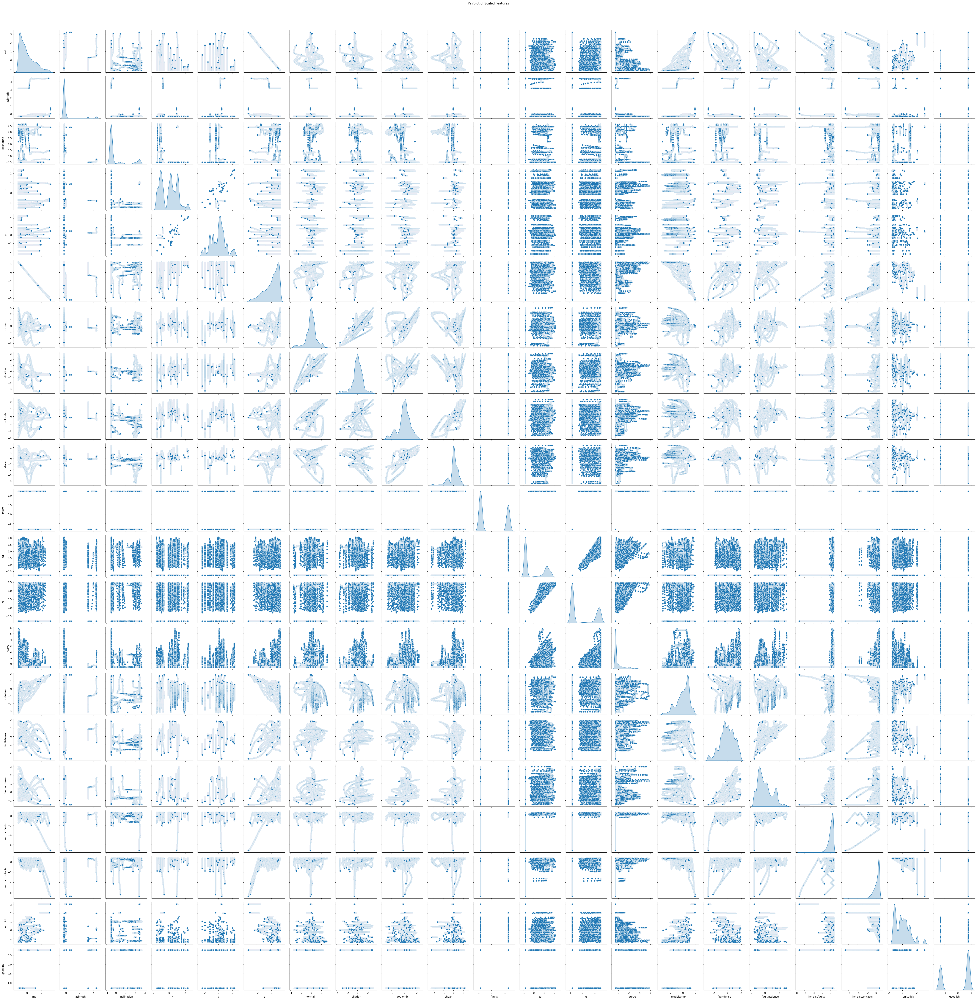

In [4]:
# Pairplot
sns.pairplot(pd.DataFrame(data_scaled, columns=data.select_dtypes(include=[np.number]).columns), diag_kind='kde')
plt.suptitle("Pairplot of Scaled Features", y=1.02)
plt.tight_layout()
plt.show()

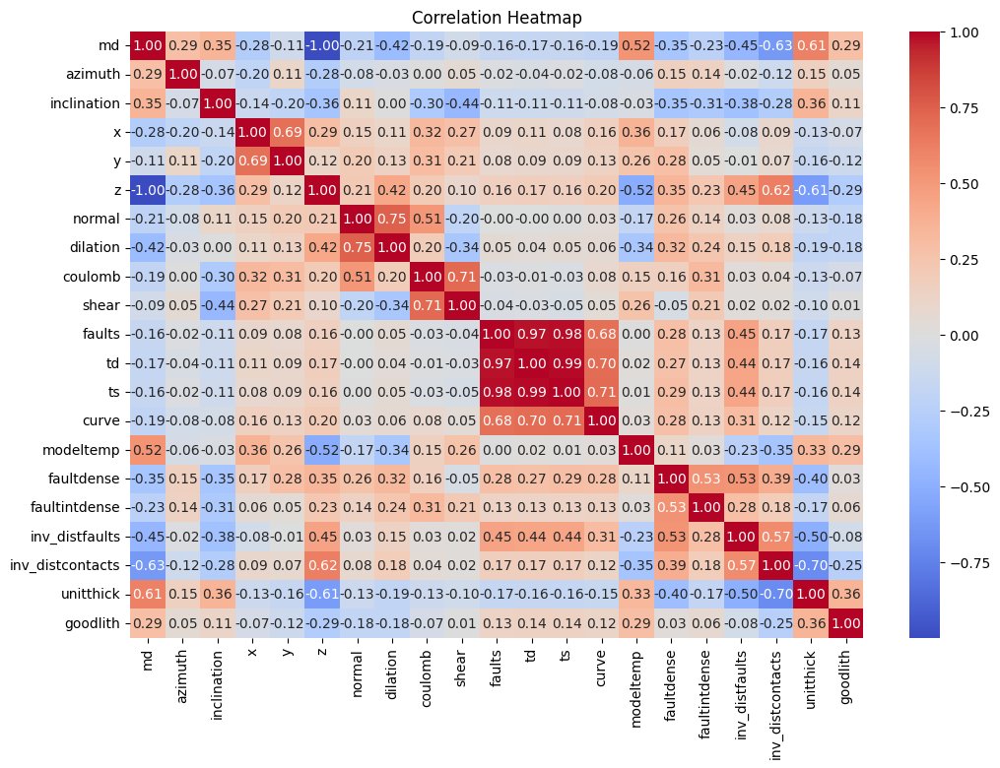

In [5]:
# Correlation Heatmap
plt.figure(figsize=(12, 8))
correlation_matrix = pd.DataFrame(data_scaled, columns=data.select_dtypes(include=[np.number]).columns).corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap")
plt.show()

In [6]:
# Initialize results dictionary
results = {}

# 1. KMeans Clustering

Optimal number of clusters: 4


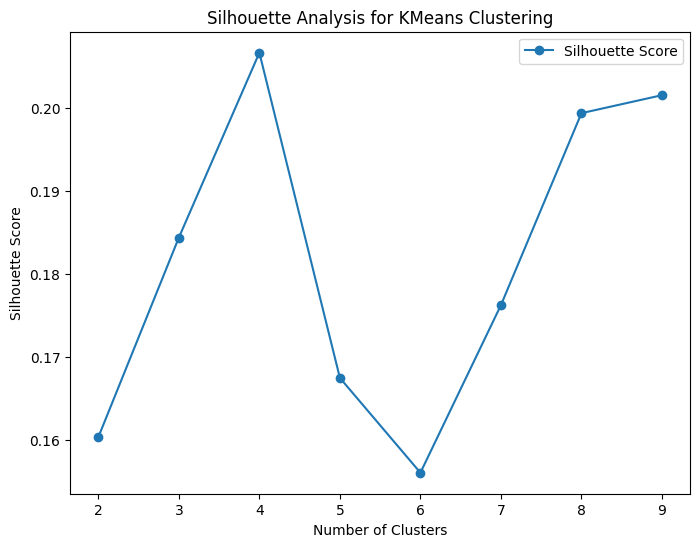

In [7]:
kmeans_scores = []
kmeans_range = range(2, 10)

# Determine the optimal number of clusters using silhouette score
for k in kmeans_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    score = silhouette_score(data_scaled, kmeans.labels_)
    kmeans_scores.append(score)

# Select the optimal number of clusters
optimal_k = kmeans_range[np.argmax(kmeans_scores)]
print(f"Optimal number of clusters: {optimal_k}")

# Apply KMeans clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_labels = kmeans.fit_predict(data_scaled)

# Add cluster labels to the dataset
data['kmeans_cluster'] = kmeans_labels

# Update results dictionary
results['KMeans'] = {
    'optimal_k': optimal_k,
    'silhouette_scores': kmeans_scores,
    'optimal_silhouette': max(kmeans_scores),
    'labels': kmeans_labels.tolist()
}

# Plot silhouette scores for KMeans clustering
plt.figure(figsize=(8, 6))
plt.plot(kmeans_range, kmeans_scores, marker='o', label='Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis for KMeans Clustering')
plt.legend()
plt.show()

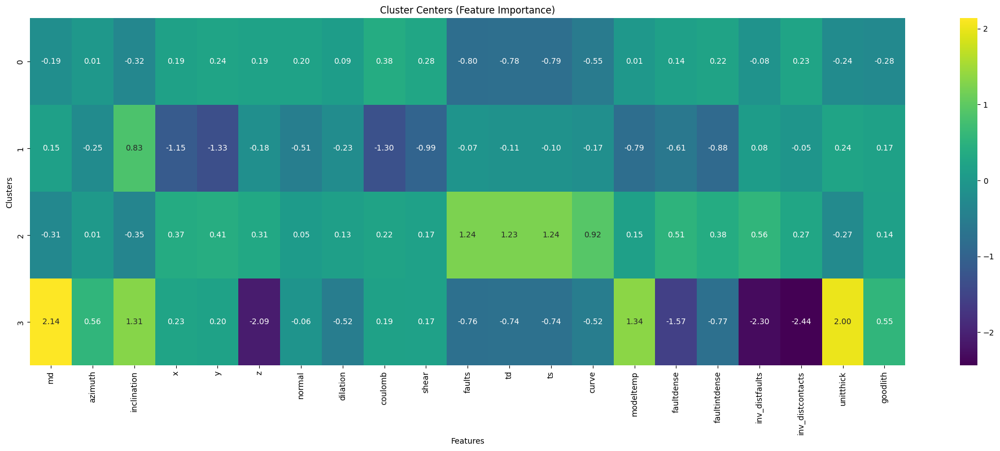

In [8]:
# Identify numeric columns used during scaling
numeric_columns = data.select_dtypes(include=[np.number]).columns

# Ensure the cluster centers align with the scaled numeric columns
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=numeric_columns[:kmeans.cluster_centers_.shape[1]])

# Plot the cluster centers as a heatmap
plt.figure(figsize=(25, 8))
sns.heatmap(cluster_centers, cmap='viridis', annot=True, fmt=".2f")
plt.title("Cluster Centers (Feature Importance)")
plt.xlabel("Features")
plt.ylabel("Clusters")
plt.show()

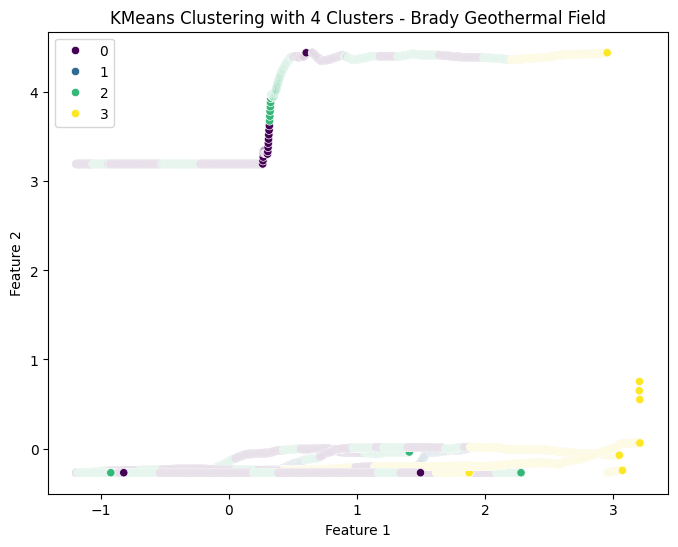

In [9]:
# Visualization of KMeans clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_scaled[:, 0], y=data_scaled[:, 1], hue=kmeans_labels, palette='viridis', legend='full')
plt.title(f'KMeans Clustering with {optimal_k} Clusters - Brady Geothermal Field')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

This method partitions the dataset into clusters based on feature similarity, which can be used for showing something like clustering fault zones from these data. To do this, I need to use the silhouette to see the best number of clustering that should be used when looking at this data.

From this information and the prior data in the EDA portion of this process, along with external understanding of the groundtruth characteristics of geothermal systems, it can be assumed that that the measured depth and the inverse distance to contacts have a stronger negative correlation, which could allow for a better viewing of clustering in further methods.

For another attempt at the KMeans, I looked into the elbow method below, and found mixed results in the results on both attempts. While there are some patterns that arise, the clustering is not entirely clear.

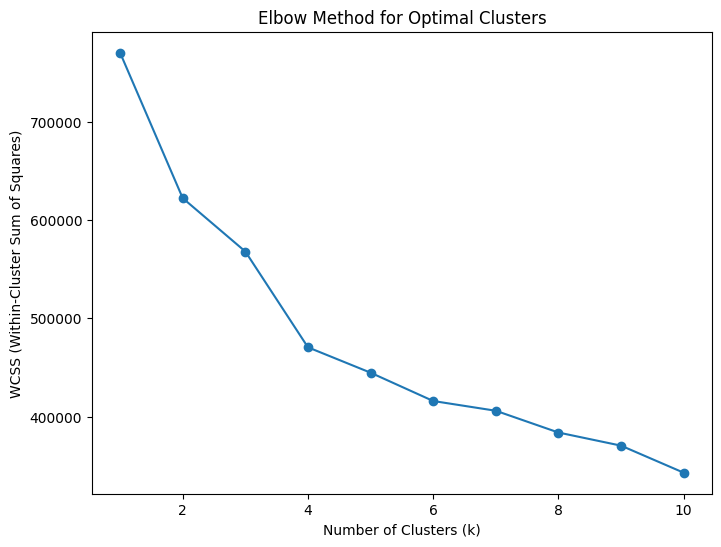

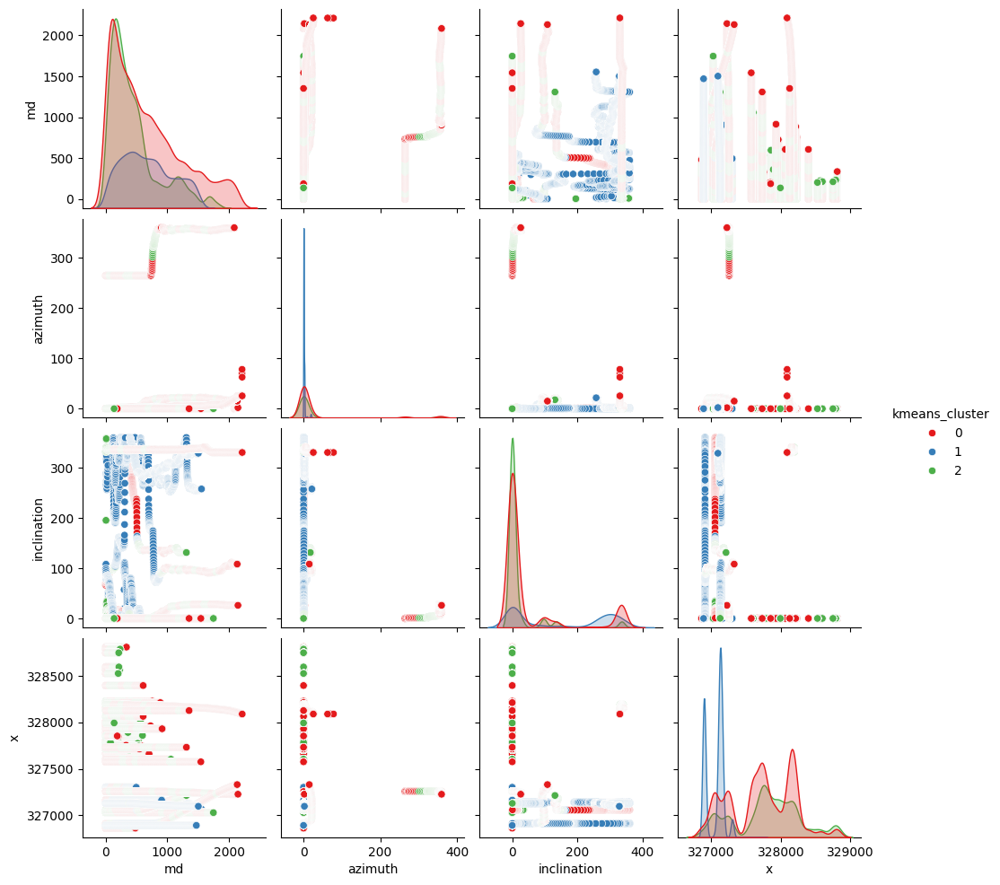

KMeans score: -567853.8053818672


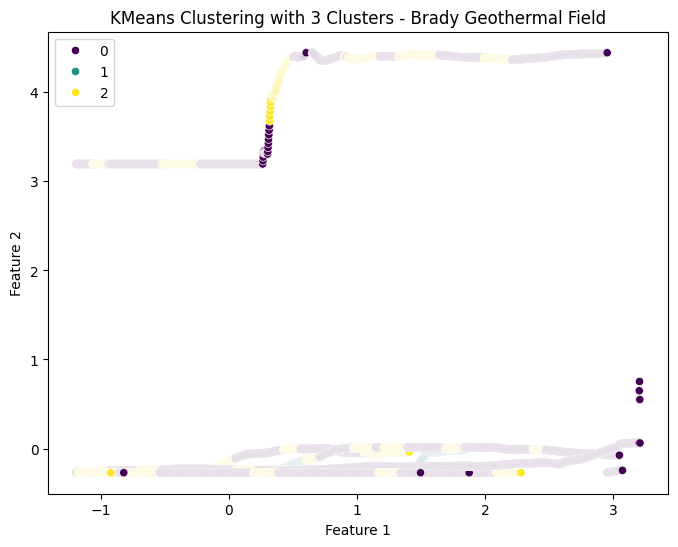

In [10]:
# Scaling the data for KMeans
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.select_dtypes(include=[np.number]))

# Apply KMeans Clustering with Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)  # Inertia is WCSS

plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.show()

# Apply KMeans clustering with optimal clusters (based on elbow method)
optimal_k = 3  # Choose optimal_k based on the elbow point from the graph
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_labels = kmeans.fit_predict(data_scaled)

# Add cluster labels to the dataset
data['kmeans_cluster'] = kmeans_labels

# Create the pair plot
numeric_columns = data.select_dtypes(include=[np.number]).columns
sns.pairplot(data, hue='kmeans_cluster', vars=numeric_columns[:4], palette='Set1')
plt.show()

# KMeans Score
score = kmeans.score(data_scaled)
print(f"KMeans score: {score}")

# Visualization of KMeans clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_scaled[:, 0], y=data_scaled[:, 1], hue=kmeans_labels, palette='viridis', legend='full')
plt.title(f'KMeans Clustering with {optimal_k} Clusters - Brady Geothermal Field')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

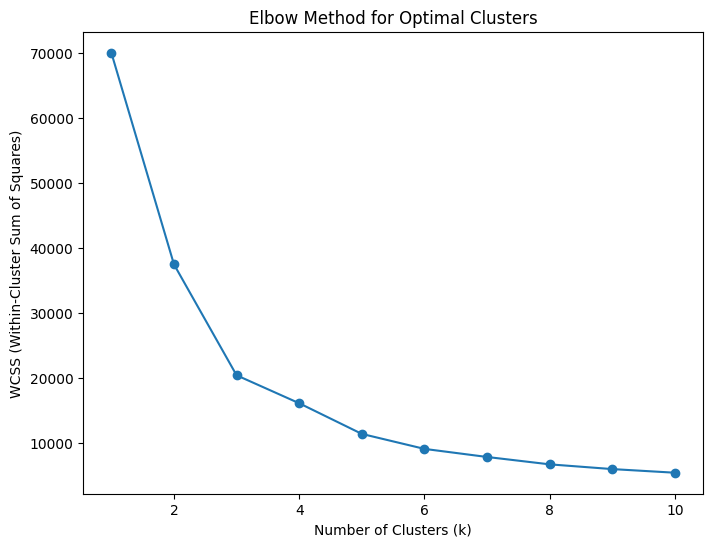

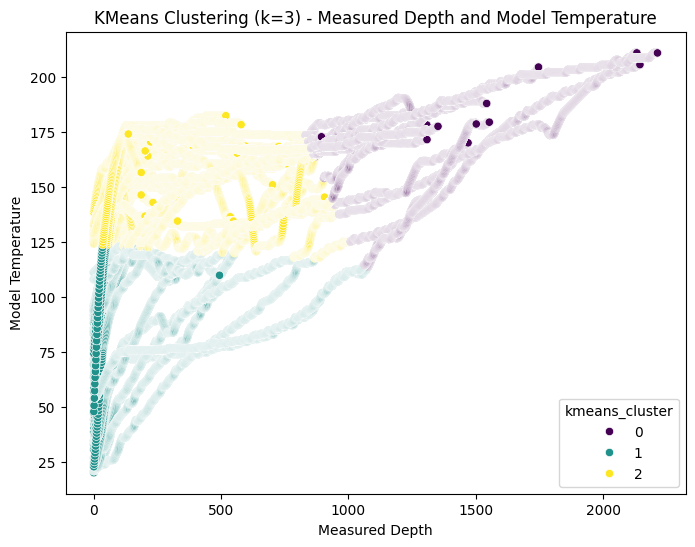

In [11]:
# Select features for clustering
features = ['md', 'modeltemp']  # Measured Depth and Model Temperature
X = data[features]

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Determine optimal number of clusters using the Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.show()

# Apply KMeans clustering with the chosen number of clusters
optimal_k = 3  # Choose optimal_k based on the elbow point from the graph
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', random_state=42)
data['kmeans_cluster'] = kmeans.fit_predict(X_scaled)

# Visualize the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x='md', y='modeltemp', hue='kmeans_cluster', data=data, palette='viridis')
plt.title(f'KMeans Clustering (k={optimal_k}) - Measured Depth and Model Temperature')
plt.xlabel('Measured Depth')
plt.ylabel('Model Temperature')
plt.show()

#2. DBSCAN


Optimal epsilon: 0.2
DBSCAN Silhouette Score could not be calculated (only one cluster found).
Number of clusters: 1


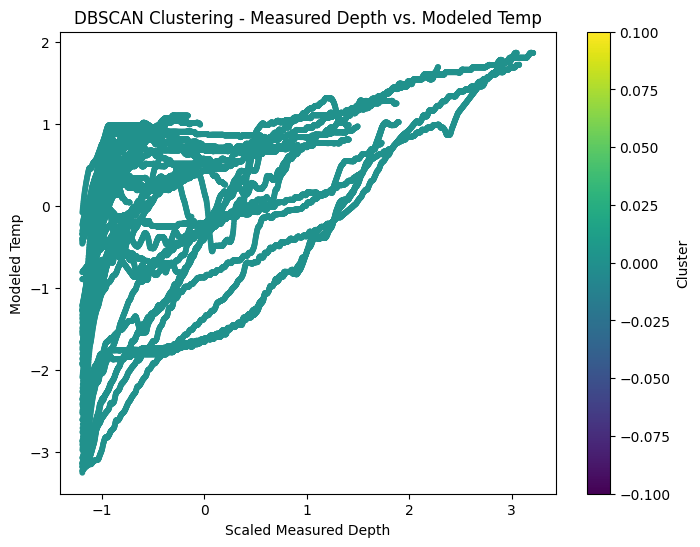

In [12]:
# Scale the specific features for DBSCAN
selected_features = data[['md', 'modeltemp']]
selected_features_scaled = scaler.fit_transform(selected_features)

# Perform DBSCAN with adjusted parameters
dbscan_scores = []
optimal_min_samples = 5  # Default min_samples
for eps in np.linspace(0.2, 1.5, 15):  # Expanded epsilon range
    dbscan = DBSCAN(eps=eps, min_samples=optimal_min_samples)
    dbscan.fit(selected_features_scaled)
    labels = dbscan.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    if n_clusters > 1:
        dbscan_scores.append(silhouette_score(selected_features_scaled, labels))
    else:
        dbscan_scores.append(-1)

# Select the optimal epsilon
optimal_eps = np.linspace(0.2, 1.5, 15)[np.argmax(dbscan_scores)]
print(f"Optimal epsilon: {optimal_eps}")

# Apply DBSCAN with the optimal epsilon
dbscan = DBSCAN(eps=optimal_eps, min_samples=optimal_min_samples)
dbscan_labels = dbscan.fit_predict(selected_features_scaled)

# Add the cluster labels to the dataset
data['dbscan_cluster'] = dbscan_labels

# Check for valid clusters before calculating the silhouette score
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
if n_clusters > 1:
    dbscan_silhouette = silhouette_score(selected_features_scaled, dbscan_labels)
    print(f"DBSCAN Silhouette Score: {dbscan_silhouette}")
else:
    dbscan_silhouette = None
    print("DBSCAN Silhouette Score could not be calculated (only one cluster found).")

# Print the number of clusters
print(f"Number of clusters: {n_clusters}")

# Visualize DBSCAN clustering
plt.figure(figsize=(8, 6))
scatter = plt.scatter(selected_features_scaled[:, 0], selected_features_scaled[:, 1], c=dbscan_labels, cmap='viridis', s=10)
plt.colorbar(scatter, label='Cluster')
plt.title('DBSCAN Clustering - Measured Depth vs. Modeled Temp')
plt.xlabel('Scaled Measured Depth')
plt.ylabel('Modeled Temp')
plt.show()

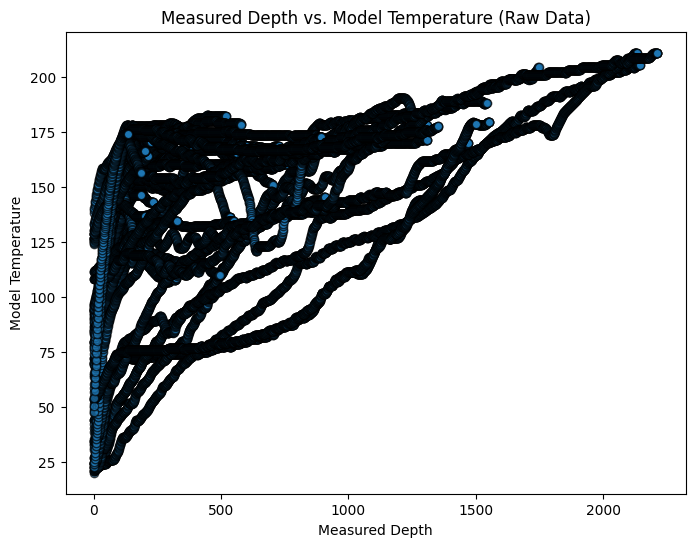

In [13]:
plt.figure(figsize=(8, 6))
plt.scatter(data['md'], data['modeltemp'], alpha=0.7, edgecolor='k')
plt.title('Measured Depth vs. Model Temperature (Raw Data)')
plt.xlabel('Measured Depth')
plt.ylabel('Model Temperature')
plt.show()

Optimal epsilon: 0.2
DBSCAN Silhouette Score could not be calculated (only one cluster found).
Number of clusters: 1


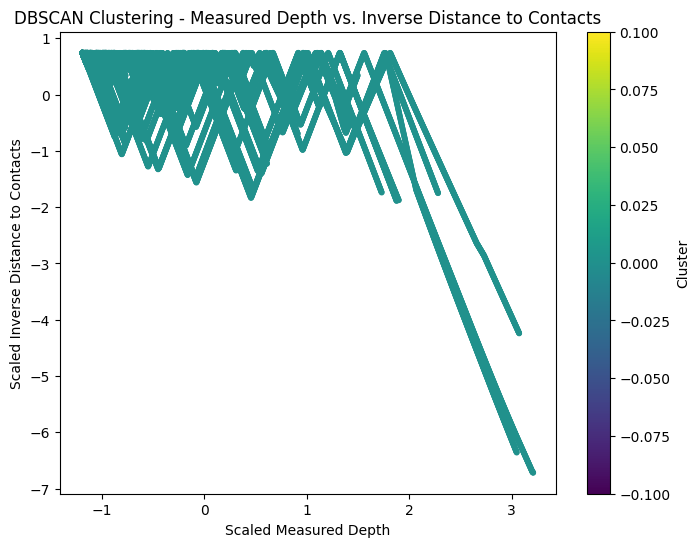

In [14]:
# Scale the specific features for DBSCAN
selected_features = data[['md', 'inv_distcontacts']]
selected_features_scaled = scaler.fit_transform(selected_features)

# Perform DBSCAN with adjusted parameters
dbscan_scores = []
optimal_min_samples = 5  # Default min_samples
for eps in np.linspace(0.2, 1.5, 15):  # Expanded epsilon range
    dbscan = DBSCAN(eps=eps, min_samples=optimal_min_samples)
    dbscan.fit(selected_features_scaled)
    labels = dbscan.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    if n_clusters > 1:
        dbscan_scores.append(silhouette_score(selected_features_scaled, labels))
    else:
        dbscan_scores.append(-1)

# Select the optimal epsilon
optimal_eps = np.linspace(0.2, 1.5, 15)[np.argmax(dbscan_scores)]
print(f"Optimal epsilon: {optimal_eps}")

# Apply DBSCAN with the optimal epsilon
dbscan = DBSCAN(eps=optimal_eps, min_samples=optimal_min_samples)
dbscan_labels = dbscan.fit_predict(selected_features_scaled)

# Add the cluster labels to the dataset
data['dbscan_cluster'] = dbscan_labels

# Check for valid clusters before calculating the silhouette score
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
if n_clusters > 1:
    dbscan_silhouette = silhouette_score(selected_features_scaled, dbscan_labels)
    print(f"DBSCAN Silhouette Score: {dbscan_silhouette}")
else:
    dbscan_silhouette = None
    print("DBSCAN Silhouette Score could not be calculated (only one cluster found).")

# Print the number of clusters
print(f"Number of clusters: {n_clusters}")

# Visualize DBSCAN clustering
plt.figure(figsize=(8, 6))
scatter = plt.scatter(selected_features_scaled[:, 0], selected_features_scaled[:, 1], c=dbscan_labels, cmap='viridis', s=10)
plt.colorbar(scatter, label='Cluster')
plt.title('DBSCAN Clustering - Measured Depth vs. Inverse Distance to Contacts')
plt.xlabel('Scaled Measured Depth')
plt.ylabel('Scaled Inverse Distance to Contacts')
plt.show()

Using this DBscan method, I was initally able to see a basic trend between the modeled temperature and modeled depth, but I was only able to back out one cluster, even after playing with the optimal minimum samples. This might indicate that there is a close correlation between these that can't be discerned into more helpful information via DBscan. And then using a strong negative correlation above with the measured depth and inverse distance to contacts, it still returned a single cluster value, indicating that dbscan may not be bethe best method for this dataset, or that it needs continued parameter tweaking for it to be effective. The following attempt to work on including another feature, specifically fault density, is below, which shows mild variation, but not a lot of additional information on these data.

Optimal epsilon: 0.2
DBSCAN Silhouette Score: -0.09323247911562128
Number of clusters: 3


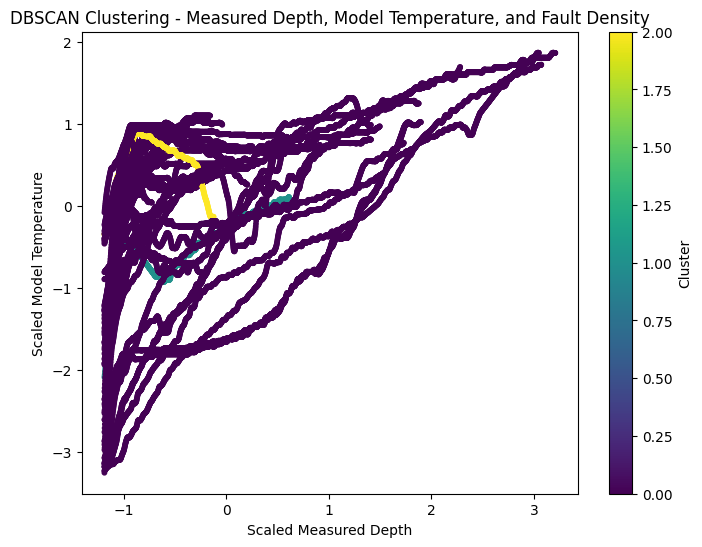

In [15]:
# Scaling the specific features for DBSCAN
scaler = StandardScaler()
selected_features = data[['md', 'modeltemp', 'faultdense']]
selected_features_scaled = scaler.fit_transform(selected_features)
# Find optimal epsilon using silhouette score
dbscan_scores = []
optimal_min_samples = 5  # Default min_samples
for eps in np.linspace(0.2, 1.5, 15):  # Expanded epsilon range
    dbscan = DBSCAN(eps=eps, min_samples=optimal_min_samples)
    dbscan.fit(selected_features_scaled)
    labels = dbscan.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    if n_clusters > 1:  # Ensure more than one cluster exists
        dbscan_scores.append(silhouette_score(selected_features_scaled, labels))
    else:
        dbscan_scores.append(-1)  # No valid clustering

# Select the optimal epsilon
optimal_eps = np.linspace(0.2, 1.5, 15)[np.argmax(dbscan_scores)]
print(f"Optimal epsilon: {optimal_eps}")

# Apply DBSCAN with optimal epsilon and visualize results
dbscan = DBSCAN(eps=optimal_eps, min_samples=optimal_min_samples)
dbscan_labels = dbscan.fit_predict(selected_features_scaled)

# Add the cluster labels to the dataset
data['dbscan_cluster'] = dbscan_labels

# Check for valid clusters before calculating the silhouette score
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
if n_clusters > 1:
    dbscan_silhouette = silhouette_score(selected_features_scaled, dbscan_labels)
    print(f"DBSCAN Silhouette Score: {dbscan_silhouette}")
else:
    dbscan_silhouette = None
    print("DBSCAN Silhouette Score could not be calculated (only one cluster found).")

# Print the number of clusters
print(f"Number of clusters: {n_clusters}")

# Update results dictionary
results = {}
results['DBSCAN'] = {
    'labels': dbscan_labels.tolist(),
    'silhouette': dbscan_silhouette,
    'optimal_eps': optimal_eps,
    'num_clusters': n_clusters
}

# Visualize DBSCAN clustering
plt.figure(figsize=(8, 6))
scatter = plt.scatter(selected_features_scaled[:, 0], selected_features_scaled[:, 1], c=dbscan_labels, cmap='viridis', s=10)
plt.colorbar(scatter, label='Cluster')
plt.title('DBSCAN Clustering - Measured Depth, Model Temperature, and Fault Density')
plt.xlabel('Scaled Measured Depth')
plt.ylabel('Scaled Model Temperature')
plt.show()

# 3. Gaussian Mixture Model

Continuing from above, the fault density appears to allow for some more variation in clustering, so I went with the differences between that and the measured depth, to see if anything comes from these data in the method. Initally I had used the model temp versus the measured depth to limit changes in variables to the method used, as shown below, but that returned similar results to the DBSCAN models.

Optimal number of components: 2


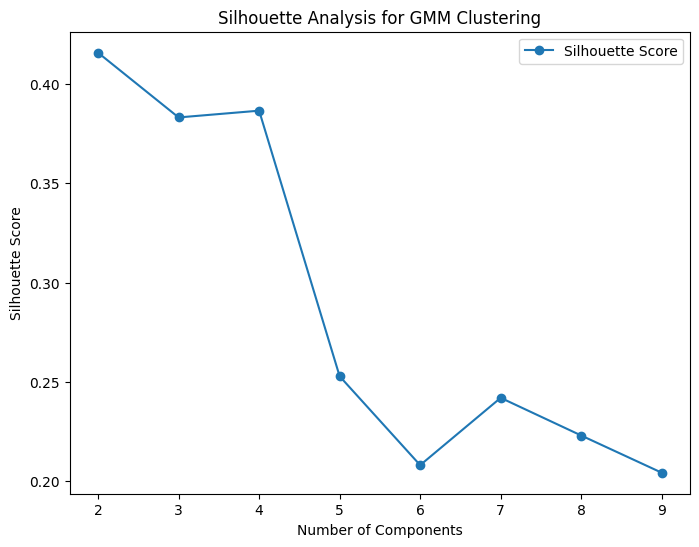

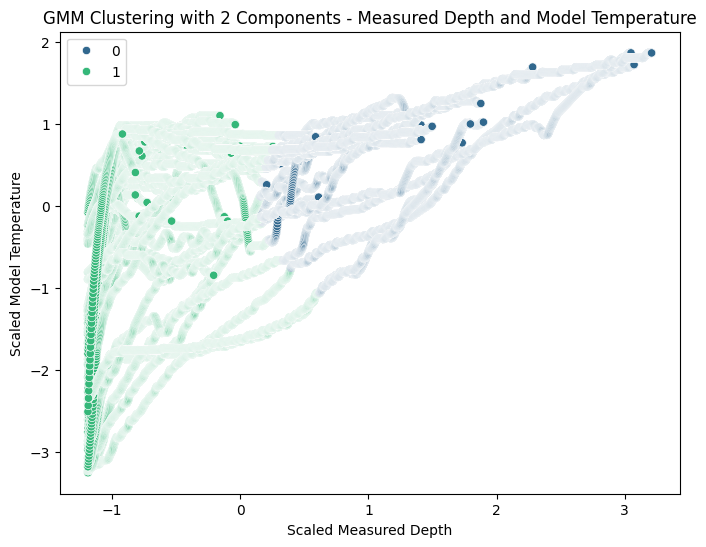

In [16]:
# Scaling the specific features for Gaussian Mixture Model
scaler = StandardScaler()
selected_features = data[['md', 'modeltemp']]
selected_features_scaled = scaler.fit_transform(selected_features)

# Determine the optimal number of components using silhouette score
gmm_scores = []
gmm_range = range(2, 10)  # Test components from 2 to 9
for n_components in gmm_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm_labels = gmm.fit_predict(selected_features_scaled)
    score = silhouette_score(selected_features_scaled, gmm_labels)
    gmm_scores.append(score)

# Select the optimal number of components
optimal_gmm_components = gmm_range[np.argmax(gmm_scores)]
print(f"Optimal number of components: {optimal_gmm_components}")

# Apply Gaussian Mixture Model with the optimal number of components
gmm = GaussianMixture(n_components=optimal_gmm_components, random_state=42)
gmm_labels = gmm.fit_predict(selected_features_scaled)

# Add cluster labels to the dataset
data['gmm_cluster'] = gmm_labels

# Calculate final scores
gmm_silhouette = silhouette_score(selected_features_scaled, gmm_labels)
gmm_davies_bouldin = davies_bouldin_score(selected_features_scaled, gmm_labels)

# Update results dictionary
results = {}
results['GaussianMixture'] = {
    'optimal_components': optimal_gmm_components,
    'silhouette_scores': gmm_scores,
    'final_silhouette': gmm_silhouette,
    'davies_bouldin': gmm_davies_bouldin,
    'labels': gmm_labels.tolist()
}

# Plot silhouette scores for GMM
plt.figure(figsize=(8, 6))
plt.plot(gmm_range, gmm_scores, marker='o', label='Silhouette Score')
plt.xlabel('Number of Components')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis for GMM Clustering')
plt.legend()
plt.show()

# Visualization for Gaussian Mixture
plt.figure(figsize=(8, 6))
sns.scatterplot(x=selected_features_scaled[:, 0], y=selected_features_scaled[:, 1], hue=gmm_labels, palette='viridis', legend='full')
plt.title(f'GMM Clustering with {optimal_gmm_components} Components - Measured Depth and Model Temperature')
plt.xlabel('Scaled Measured Depth')
plt.ylabel('Scaled Model Temperature')
plt.show()

Optimal number of components: 2


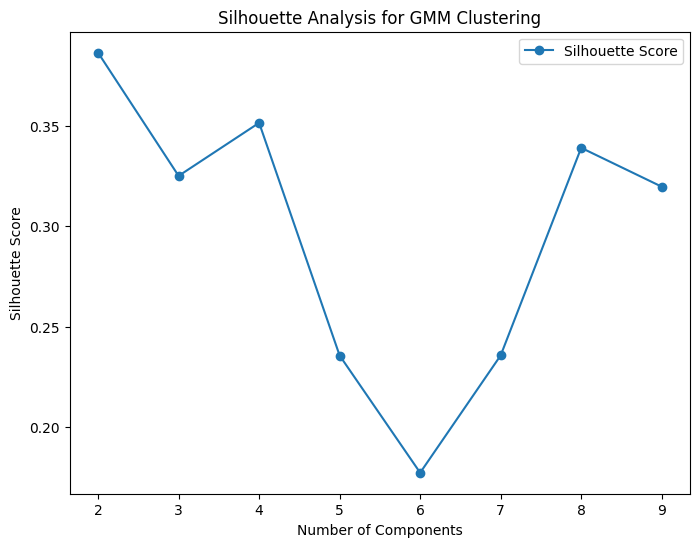

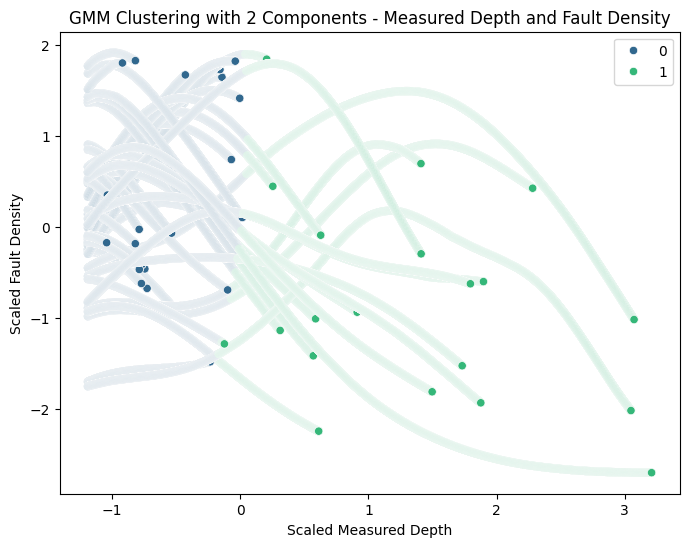

In [17]:
# Scaling the specific features for Gaussian Mixture Model
scaler = StandardScaler()
selected_features = data[['md', 'faultdense']]
selected_features_scaled = scaler.fit_transform(selected_features)
# Determine the optimal number of components using silhouette score
gmm_scores = []
gmm_range = range(2, 10)  # Test components from 2 to 9
for n_components in gmm_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm_labels = gmm.fit_predict(selected_features_scaled)
    score = silhouette_score(selected_features_scaled, gmm_labels)
    gmm_scores.append(score)

# Select the optimal number of components
optimal_gmm_components = gmm_range[np.argmax(gmm_scores)]
print(f"Optimal number of components: {optimal_gmm_components}")

# Apply Gaussian Mixture Model with the optimal number of components
gmm = GaussianMixture(n_components=optimal_gmm_components, random_state=42)
gmm_labels = gmm.fit_predict(selected_features_scaled)

# Add cluster labels to the dataset
data['gmm_cluster'] = gmm_labels

# Calculate final scores
gmm_silhouette = silhouette_score(selected_features_scaled, gmm_labels)
gmm_davies_bouldin = davies_bouldin_score(selected_features_scaled, gmm_labels)

# Update results dictionary
results = {}
results['GaussianMixture'] = {
    'optimal_components': optimal_gmm_components,
    'silhouette_scores': gmm_scores,
    'final_silhouette': gmm_silhouette,
    'davies_bouldin': gmm_davies_bouldin,
    'labels': gmm_labels.tolist()
}

# Plot silhouette scores for GMM
plt.figure(figsize=(8, 6))
plt.plot(gmm_range, gmm_scores, marker='o', label='Silhouette Score')
plt.xlabel('Number of Components')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis for GMM Clustering')
plt.legend()
plt.show()

# Visualization for Gaussian Mixture
plt.figure(figsize=(8, 6))
sns.scatterplot(x=selected_features_scaled[:, 0], y=selected_features_scaled[:, 1], hue=gmm_labels, palette='viridis', legend='full')
plt.title(f'GMM Clustering with {optimal_gmm_components} Components - Measured Depth and Fault Density')
plt.xlabel('Scaled Measured Depth')
plt.ylabel('Scaled Fault Density')
plt.show()


#4. PCA

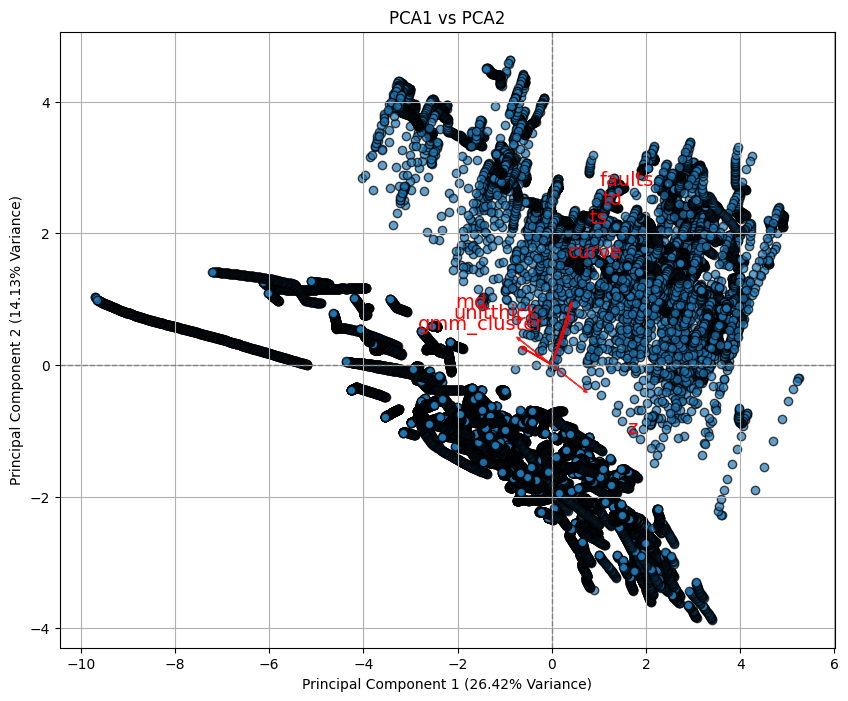

Explained Variance Ratios: [0.26423139 0.14126595]
Top Contributing Features: ['ts', 'td', 'faults', 'z', 'md', 'curve', 'gmm_cluster', 'unitthick']


In [18]:
# Scaling the data for PCA
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.select_dtypes(include=[np.number]))

# Perform PCA
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
pca_result = pca.fit_transform(data_scaled)

# Extract explained variance and eigenvectors (loadings)
explained_variance = pca.explained_variance_ratio_
eigenvectors = pca.components_

# Scatter plot of PCA1 vs PCA2
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.7, edgecolor='k')
plt.xlabel(f"Principal Component 1 ({explained_variance[0]*100:.2f}% Variance)")
plt.ylabel(f"Principal Component 2 ({explained_variance[1]*100:.2f}% Variance)")
plt.title("PCA1 vs PCA2")

# Calculate eigenvector magnitudes
eigenvector_magnitudes = np.sqrt(eigenvectors[0, :]**2 + eigenvectors[1, :]**2)

# Sort features by their contributions
sorted_indices = np.argsort(eigenvector_magnitudes)[::-1]
top_features = sorted_indices[:8]  # Select top 8 features

# Overlay only the top eigenvectors with adjusted text placement
text_positions = []  # To avoid overlaps
for i in top_features:
    start_x, start_y = eigenvectors[0, i] * 2, eigenvectors[1, i] * 2
    text_x, text_y = start_x * 2.5, start_y * 2.5
    while any(np.hypot(text_x - tx, text_y - ty) < 0.3 for tx, ty in text_positions):
        text_x += 0.1  # Shift text right
        text_y += 0.1  # Shift text up

    text_positions.append((text_x, text_y))

    plt.arrow(0, 0, start_x, start_y, color='r', alpha=0.8, head_width=0.05)
    plt.text(text_x, text_y, data.select_dtypes(include=[np.number]).columns[i],
             color='r', fontsize=14, ha='center', va='center')

# Add grid for better visualization
plt.grid()
plt.axhline(0, color='gray', lw=1, linestyle='--')
plt.axvline(0, color='gray', lw=1, linestyle='--')
plt.show()

# Output PCA Results
print("Explained Variance Ratios:", explained_variance)
print("Top Contributing Features:", data.select_dtypes(include=[np.number]).columns[top_features].tolist())


The PCA analysis shows the features affecting the variability in the dataset the most, including modeltemp (modeled temperature), md (measured depth), and faultdense (fault density).
These features work with geological concepts, as temperature and fault structures are pivotal for assessing geothermal potential.



# 5. t-SNE

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


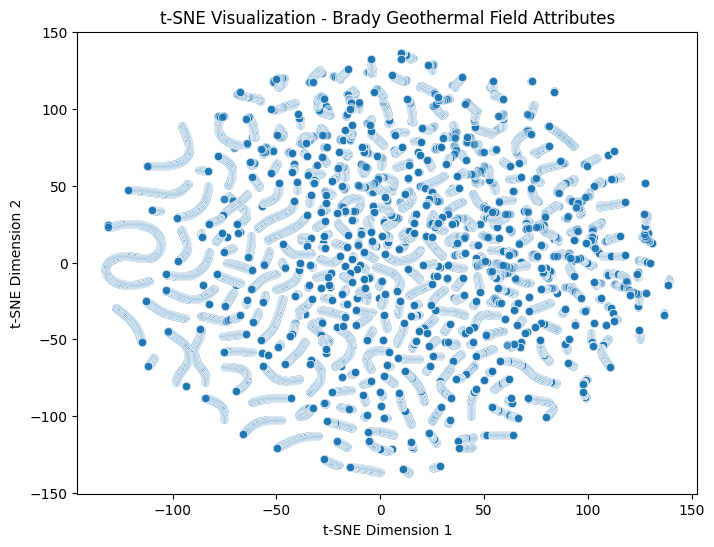

In [19]:
# Scaling the data for t-SNE
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.select_dtypes(include=[np.number]))

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_result = tsne.fit_transform(data_scaled)

# Visualization for t-SNE
plt.figure(figsize=(8, 6))
sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], alpha=0.7)
plt.title('t-SNE Visualization - Brady Geothermal Field Attributes')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

This method shows no correlation in the dimensions compared to PCA.



#Conclusion

#Which method did you like the most?
The method I like the most for this problem is PCA. It shows the underlying patterns in the data while keeping it simpler. By putting the high-dimensional data onto two  components (PC1 and PC2), PCA can show the majority of the dataset's variability in a single output. In this scenario, the first two principal components show a significant proportion of the variance (80%), providing a good view of the geothermal data in this dataset.

The scatterplot of PC1 vs. PC2 shows clusters, indicating wells with similar geothermal characteristics. For instance, clusters could represent areas with comparable temperature gradients or depth.
Using eigenvectors overlaid on the plot, I can see how specific features influence the orientation of data points. For example, the vector for fault density can align with clusters associated with high fault activity.

#Which method did you like the least?
The method I like the least for this problem is t-SNE, as I was unable to gather any information from my implementation of this method. I likely need to use different parameters or process my data differently, but with the current state of the data, there is little that can be taken from that model.

#How did you score these unsupervised models?
For the scoring, I used a mix of k-means, silhouette, and Davies-Bouldin scores depending on the method.

#Did the output align with your geologic understanding?
Yes, the output ultimately aligned with my geologic understanding of the system, as in a system with faults present, it showed variations in temp/pressure that did not necessarily correlate with depth as to be expected in a system without faults or geothermal activity.

#What did you want to learn more about?
I wanted to learn more about the individual processes of these methods, and specifically how they differ in their steps.

#Did you pre-process your data?
I pre-processed my data by cleaning nan values, and checking that I was using parts of the data that are applicable to machine learning uses.

#What was a decision you were most unsure about?
I was most unsure about what properties to focus on for my methods based on the results of the EDA, rather than just looking at the properties I know are related due to geologic properties.